<a href="https://colab.research.google.com/github/soumik12345/RCNN/blob/master/notebooks/RCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pascal VOC 2012

## Introduction

The main goal of this challenge is to recognize objects from a number of visual object classes in realistic scenes (i.e. not pre-segmented objects). It is fundamentally a supervised learning learning problem in that a training set of labelled images is provided. The twenty object classes that have been selected are:

- *Person:* person
- *Animal:* bird, cat, cow, dog, horse, sheep
- *Vehicle:* aeroplane, bicycle, boat, bus, car, motorbike, train
- *Indoor:* bottle, chair, dining table, potted plant, sofa, tv/monitor

There are three main object recognition competitions: classification, detection, and segmentation, a competition on action classification, and a competition on large scale recognition run by ImageNet. In addition there is a "taster" competition on person layout. We will currently be focussing of the task of **Detection**, prediction of the bounding box and label of each object from the twenty target classes in the test image.

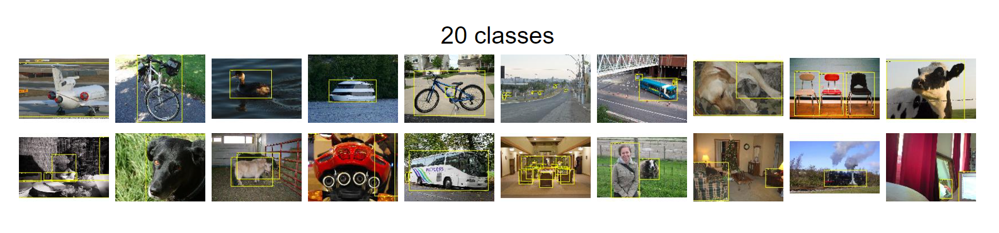

## Setting up the dataset

We will first download and extract the data from the mirror link

In [ ]:
# !wget http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar
# !wget http://pjreddie.com/media/files/VOCtrainval_11-May-2012.tar
# !tar -xf VOCtrainval_11-May-2012.tar

Note, if the mirror link doesn't work or the download speed is too slow. We can also download the dataset from [Kaggle](https://www.kaggle.com/huanghanchina/pascal-voc-2012). In that case, please follow these steps:

1. Go to your Kaggle account, scroll to API section and click **Expire API Token** to remove previous tokens.

2. Click on **Create New API Token** - it would download `kaggle.json` file on your system.

3. Execute the following cell (make sure that you upload the api token file while prompted to do so).

In [ ]:
print('Installing Kaggle...')
!pip install -q kaggle
print('Done!')

print('Please upload kaggle.json: ')
from google.colab import files
files.upload()
print('Done!')

print('Placing kaggle.json in the right place...')
!mkdir ~/.kaggle

!cp kaggle.json ~/.kaggle/

!chmod 600 ~/.kaggle/kaggle.json
print('Done!')

print('Dowloading Pascal VOC 2012...')
!kaggle datasets download -d huanghanchina/pascal-voc-2012
print('Done!')

print('Extracting Dataset...')
!mkdir ./VOCdevkit
!unzip -q pascal-voc-2012.zip -d './VOCdevkit'
!rm pascal-voc-2012.zip
print('Done!')

Installing Kaggle...
Done!
Please upload kaggle.json: 


Saving kaggle.json to kaggle.json
Done!
Placing kaggle.json in the right place...
Done!
Dowloading Pascal VOC 2012...
 99% 3.60G/3.63G [01:16<00:00, 32.3MB/s]
100% 3.63G/3.63G [01:16<00:00, 51.1MB/s]
Done!
Extracting Dataset...
Done!


## Data Preparation and Analysis

In [ ]:
from glob import glob

image_files = glob('./VOCdevkit/VOC2012/JPEGImages/*.jpg')
annotation_files = glob('./VOCdevkit/VOC2012/Annotations/*.xml')

print('Image files:', len(image_files))
print('Annotation files:', len(annotation_files))

Image files: 17125
Annotation files: 17125


Let's take a look at an annotation file

In [ ]:
!cat {annotation_files[0]}

<annotation>
	<filename>2011_007202.jpg</filename>
	<folder>VOC2011</folder>
	<object>
		<name>person</name>
		<actions>
			<jumping>0</jumping>
			<other>1</other>
			<phoning>0</phoning>
			<playinginstrument>0</playinginstrument>
			<reading>0</reading>
			<ridingbike>0</ridingbike>
			<ridinghorse>0</ridinghorse>
			<running>0</running>
			<takingphoto>0</takingphoto>
			<usingcomputer>0</usingcomputer>
			<walking>0</walking>
		</actions>
		<bndbox>
			<xmax>403</xmax>
			<xmin>16</xmin>
			<ymax>333</ymax>
			<ymin>46</ymin>
		</bndbox>
		<difficult>0</difficult>
		<pose>Unspecified</pose>
		<point>
			<x>229</x>
			<y>158</y>
		</point>
	</object>
	<segmented>0</segmented>
	<size>
		<depth>3</depth>
		<height>333</height>
		<width>500</width>
	</size>
	<source>
		<annotation>PASCAL VOC2011</annotation>
		<database>The VOC2011 Database</database>
		<image>flickr</image>
	</source>
</annotation>


The only thing that's of any interest to us is the content enclosed by the `<filename>` tag which gives the file name of the corresponding image file, the dimensions of the image enclosed inside `<size>`, and the `<object>` tags which contains the data of an object in the image. Inside the `<object>` tag, we are interested in the class (denoted by `<name>`) and bounding box (denoted by `<bndbox>`) of the object since those are the things that we would be predicting. Note that `(xmin, ymin)` denotes the top-left corner of the bounding box and `(xmax, ymax)` denotes the bottom-right corner.

<br/>

We would now get these data points from the xml files and arrand them in a pandas dataframe for ease of access and write to a CSV file for ease of access in future. For each image, the columns of the csv is going to be the following:

- *image_id:* The ID of the image. This refers to the filename of the image without the extension. An annotation file shares this id as it's filename.

- *height:* Height of the image.
- *width:* Width of the image.
- *depth:* Number of channels of the image. `depth=3` denotes an RGB image in this case.
- *n_objects:* Number of annotated objects in the image.
- The bounding box coordinates will be denoted by the following columns:
    - *class_i:* Class name of the ith object.
    - *xmin_i:* xmin of ith object.
    - *ymin_i:* ymin of ith object.
    - *xmax_i:* xmax of ith object.
    - *ymax_i:* ymax of ith object.

where `i ∈ [0,  n_objects]`.

In [ ]:
import xml.etree.ElementTree as ET
from collections import OrderedDict


def parse_xml(file_name):
    root = ET.parse(file_name)
    n_objects = 0
    image_data = OrderedDict()
    image_data['image_id'] = file_name.split('/')[-1].split('.')[0]
    for elements in root.iter():
        # size tag
        if elements.tag == 'size':
            for element in elements:
                image_data[element.tag] = int(element.text)
        # object tag
        elif elements.tag == 'object':
            for element in elements:
                if element.tag == 'name':
                    image_data[
                        'class_' + str(n_objects + 1)
                    ] = str(element.text)
                elif element.tag == 'bndbox':
                    for bbox_element in element:
                        image_data[
                            bbox_element.tag + '_' + str(n_objects + 1)
                        ] = float(bbox_element.text)
                    n_objects += 1
    image_data['n_objects'] = n_objects
    return image_data

A sample parsed annotation file

In [ ]:
sample_data = parse_xml(annotation_files[0])
sample_data

OrderedDict([('image_id', '2011_007202'),
             ('class_1', 'person'),
             ('xmax_1', 403.0),
             ('xmin_1', 16.0),
             ('ymax_1', 333.0),
             ('ymin_1', 46.0),
             ('depth', 3),
             ('height', 333),
             ('width', 500),
             ('n_objects', 1)])

Now, we will parse all the annotation files into a single pandas dataframe

In [ ]:
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm


dataframe = []

for file_path in tqdm(annotation_files):
    image_data = parse_xml(file_path)
    dataframe.append(image_data)

dataframe = pd.DataFrame(dataframe)

print('Number of annotations parsed:', len(dataframe))
print('Max number of objects per image:', np.max(dataframe['n_objects']))


Number of annotations parsed: 17125
Max number of objects per image: 56


In [ ]:
dataframe.head()

,image_id,class_1,xmax_1,xmin_1,ymax_1,ymin_1,depth,height,width,n_objects,class_2,xmin_2,ymin_2,xmax_2,ymax_2,class_3,xmin_3,ymin_3,xmax_3,ymax_3,class_4,xmax_4,xmin_4,ymax_4,ymin_4,class_5,xmax_5,xmin_5,ymax_5,ymin_5,class_6,xmax_6,xmin_6,ymax_6,ymin_6,class_7,xmax_7,xmin_7,ymax_7,ymin_7,...,class_49,xmin_49,ymin_49,xmax_49,ymax_49,class_50,xmin_50,ymin_50,xmax_50,ymax_50,class_51,xmin_51,ymin_51,xmax_51,ymax_51,class_52,xmin_52,ymin_52,xmax_52,ymax_52,class_53,xmin_53,ymin_53,xmax_53,ymax_53,class_54,xmin_54,ymin_54,xmax_54,ymax_54,class_55,xmin_55,ymin_55,xmax_55,ymax_55,class_56,xmin_56,ymin_56,xmax_56,ymax_56
0,2011_007202,person,403.0,16.0,333.0,46.0,3,333,500,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2008_005646,person,500.0,87.0,375.0,55.0,3,375,500,3,bottle,259.0,298.0,306.0,375.0,person,86.0,61.0,308.0,375.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2011_001167,pottedplant,409.0,389.0,224.0,162.0,3,374,500,12,pottedplant,75.0,204.0,102.0,227.0,chair,388.0,232.0,437.0,300.0,chair,306.0,247.0,303.0,231.0,chair,242.0,140.0,373.0,242.0,chair,239.0,130.0,373.0,281.0,chair,367.0,263.0,373.0,328.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2011_000791,bicycle,500.0,1.0,312.0,1.0,3,375,500,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2011_000666,chair,442.0,362.0,322.0,262.0,3,333,500,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Now, we would save the dataframe in csv format.

In [ ]:
dataframe.to_csv(
    './VOCdevkit/VOC2012/detection_annotation.csv',
    index=False
)

### Basic Exploratory Analysis

In [ ]:
import plotly.express as px


fig = px.histogram(
    dataframe, x='n_objects', nbins=100,
    title='Histogram of the number of objects per image'
)
fig.show()

In [ ]:
all_class_names = []
for i in range(1, np.max(dataframe['n_objects']) + 1):
    classes = list(dataframe['class_' + str(i)])
    all_class_names += classes

In [ ]:
from collections import Counter


counter = dict(Counter(all_class_names))
classes_col = list(counter.keys())
classes_col.pop(-1) # removing NaN
counts_col = [counter[key] for key in classes_col]
frequency_df = pd.DataFrame(
    {
        'classes': classes_col,
        'counts': counts_col
    }
)

frequency_df

,classes,counts
0,person,17401
1,pottedplant,1202
2,bicycle,837
3,chair,3056
4,motorbike,801
5,horse,803
6,sofa,841
7,car,2492
8,bottle,1561
9,bird,1271


In [ ]:
fig = px.bar(
    frequency_df, x='classes', y='counts',
    title='Frrequency distribution of classes'
)
fig.show()

Note that the amount of objects labelled as *person* is humongous compared to all other classes. This is primarily because the VOC2012 dataset also includes the tasks of **Action Classification** and **Person Layout Prediction**.

In [ ]:
import matplotlib.pyplot as plt


def plot_bbox(label, xmin, ymin, xmax, ymax, backgroundcolor='pink', apply_label=True, line_color='yellow'):
    if apply_label:
        plt.text(xmin, ymin, label, fontsize=20, backgroundcolor=backgroundcolor)
    plt.plot([xmin, xmin], [ymin, ymax], linewidth=3, color=line_color)
    plt.plot([xmax, xmax], [ymin, ymax], linewidth=3, color=line_color)
    plt.plot([xmin, xmax], [ymin, ymin], linewidth=3, color=line_color)
    plt.plot([xmin, xmax], [ymax, ymax], linewidth=3, color=line_color)

In [ ]:
from PIL import Image


def plot_from_dataframe(dataframe, index):
    data  = dataframe.iloc[index, :]
    image_path = './VOCdevkit/VOC2012/JPEGImages/' + data['image_id'] + ".jpg"
    image = Image.open(image_path)
    plt.figure(figsize=(12, 12))
    plt.imshow(image)
    plt.title(data['image_id'] + ".jpg")
    for index in range(data['n_objects']):
        plot_bbox(
            data['class_' + str(index + 1)],
            data['xmin_' + str(index + 1)],
            data['ymin_' + str(index + 1)],
            data['xmax_' + str(index + 1)],
            data['ymax_' + str(index + 1)]
        )
    plt.show()

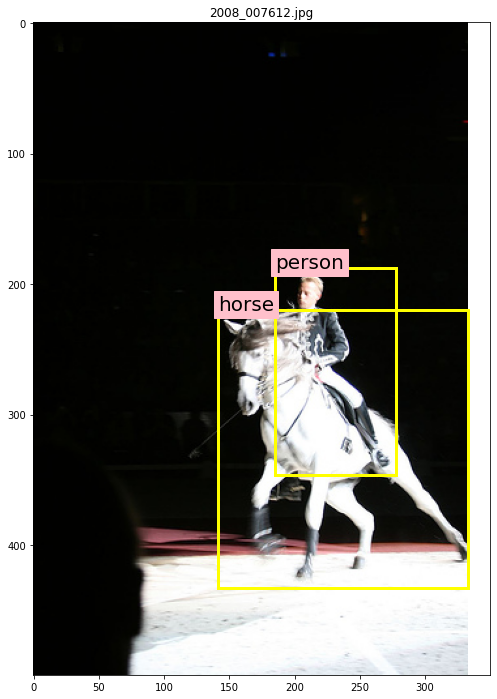

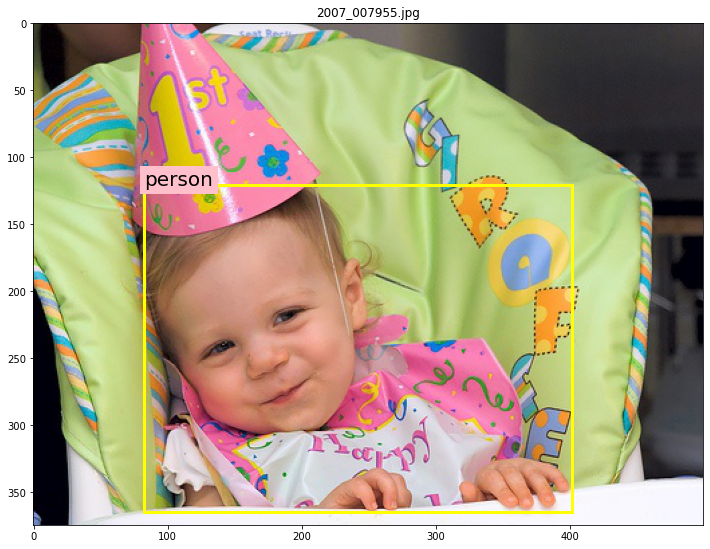

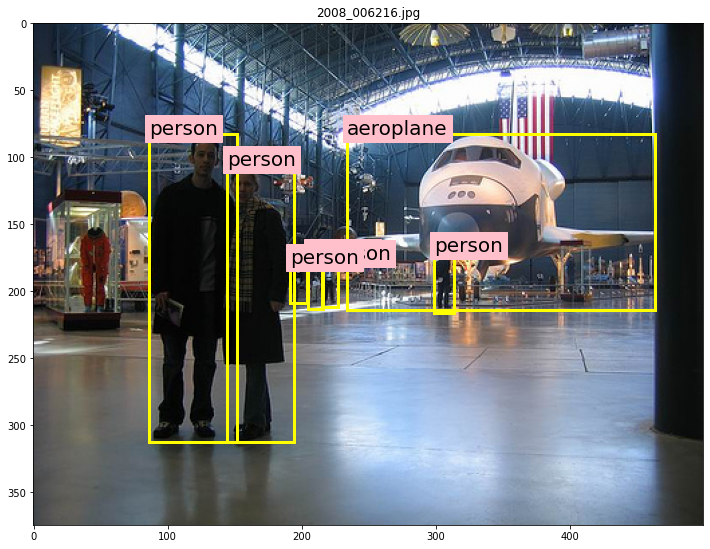

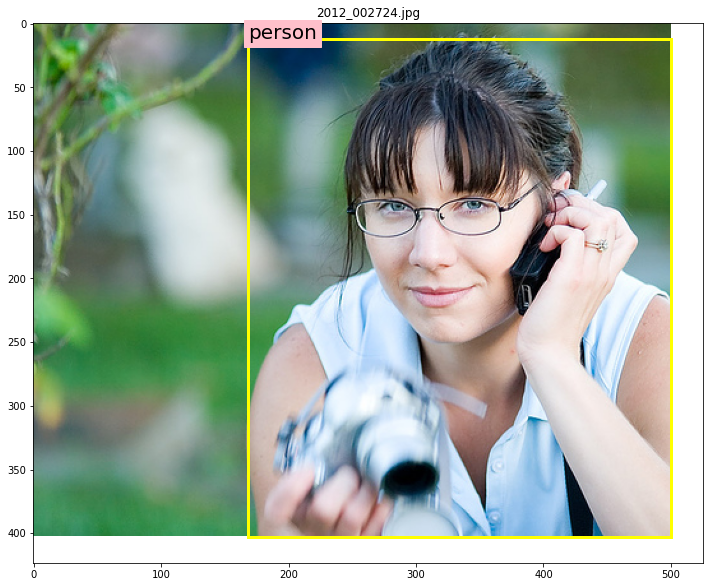

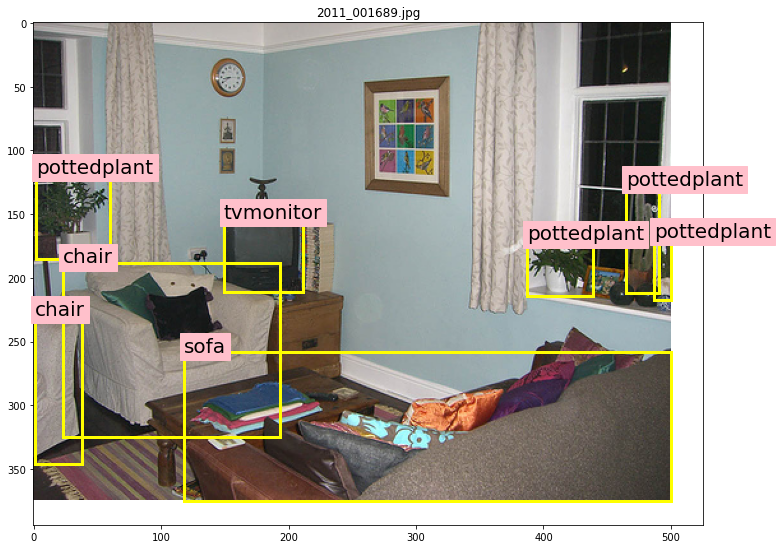

In [ ]:
for i in range(5):
    plot_from_dataframe(dataframe, np.random.randint(0, len(dataframe)))

# Overview of the RCNN System

The RCNN system was proposed by **Ross Girshick**, **Jeff Donahue**, **Trevor Darrell** and **Jitendra Malik** from UC Berkeley in their paper [Rich feature hierarchies for accurate object detection and semantic segmentation](https://arxiv.org/abs/1311.2524). RCNN stands for *Regions with CNN features*, which summarizes the working of the system in very simple terms, generating region proposals with classification using CNNs. The RCNN consists of 3 simple stages:

1. Given an input image, around 2000 bottom-up region proposals are extracted.

2. Computation of features for each proposal using a large
convolutional neural network (like pre-trained VGG or ResNets).

3. Classification of each region using class-specific linear SVMs (or MLPs).

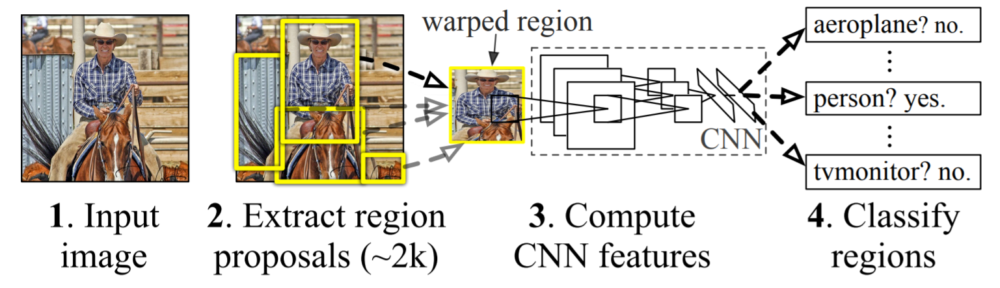

## Extracting Region Proposals

For generating the region proposals, we would look towards the following 2 papers:

1. [Efficient Graph-Based Image Segmentation](http://people.cs.uchicago.edu/~pff/papers/seg-ijcv.pdf) proposed by by Pedro F. Felzenszwalb and Daniel P. Huttenlocher.

2. [Selective Search for Object Recognition](http://www.huppelen.nl/publications/selectiveSearchDraft.pdf) proposed by J R R Uijlings, K E A van de Sande, T Gevers and A W M Smeulders.

### Fenzelswalb-Huttenlocher Segmentation

The Efficient Graph-Based Image Segmentation algorithm proposed by Felzenszwalb and Huttenlocher defines the problem of Image Segmentation as the task of partitioning a given image into a set of disjoint regions usually with a goal of simplifying the representation of the image into something that is more meaningful and easier to analyze, instead of the pixel-wise classification approach adopted by later fully convolotional architectures. This segmentation algorithm although is not super-accurate compared to its fully-convolutional counterparts, is however quite useful for generating the region proposals for the Selective Search algorithm.

#### Implementation

I have already made an attempt at explaining the Fenzelswalb-Huttenlocher segmentation algorithm on my [blog](https://soumik12345.github.io/geekyrakshit-blog/algebra/computervision/convolution/maths/python/2020/09/17/efficient-graph-based-image-segmentation.html). I created a minimal python implementation at [https://github.com/soumik12345/felzenszwalb_segmentation](https://github.com/soumik12345/felzenszwalb_segmentation) with the intention of using it for the Selective Search alogorithm for RCNN. Although the results produced by my implementation were satisfactory, I wouldn't be using it for this project because the implementation is unoptimized and takes a lot of time. RCNN being a multi-stage object detection system is already quite slow, and I don't want to make it any slower. Hence, for this project, I would be using the implementation of the algorithm as part of the [scikit image library](https://scikit-image.org/docs/dev/auto_examples/segmentation/plot_segmentations.html#felzenszwalb-s-efficient-graph-based-segmentation). The scikit image implementation of the algorithm is written in C++ is much more optimized compared to my implementation. If you are interested in understanding the paper though, feel free to take a look at my [blog](https://soumik12345.github.io/geekyrakshit-blog/algebra/computervision/convolution/maths/python/2020/09/17/efficient-graph-based-image-segmentation.html).

In [ ]:
from skimage.color import rgb2hsv
from skimage.util import img_as_float
from skimage.segmentation import felzenszwalb


def graph_based_segmentation(image, scale, sigma, min_size):
    return np.dstack([
        image, felzenszwalb(
            img_as_float(image), scale=scale,
            sigma=sigma, min_size=min_size
        )
    ])

In order to learn more about the parameters used in the above function, refer to scikit image [documentation](https://scikit-image.org/docs/dev/api/skimage.segmentation.html#skimage.segmentation.felzenszwalb).

In [ ]:
def plot_segmentation_samples(images_list, scale, sigma, min_size):
    for index, image_path in enumerate(images_list):
        original_image = Image.open(image_path)
        segmentation_result = graph_based_segmentation(
            np.array(original_image), scale, sigma, min_size
        )[:, :, -1]
        fig = plt.figure(figsize=(12, 24))
        ax = fig.add_subplot(1, 2, 1)
        ax.imshow(original_image)
        ax.set_title('Image_{}'.format(index + 1))
        ax = fig.add_subplot(1, 2, 2)
        ax.imshow(segmentation_result)
        ax.set_title(
            'Mask_{}\nscale = {}, sigma = {}, min_size = {} \nUnique Regions: {}'.format(
                index + 1, scale, sigma, min_size, len(np.unique(segmentation_result))
            )
        )
        plt.show()

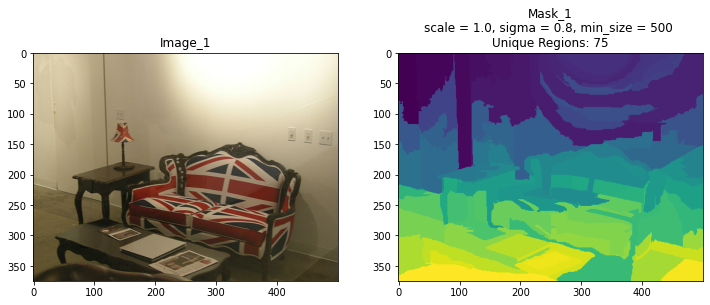

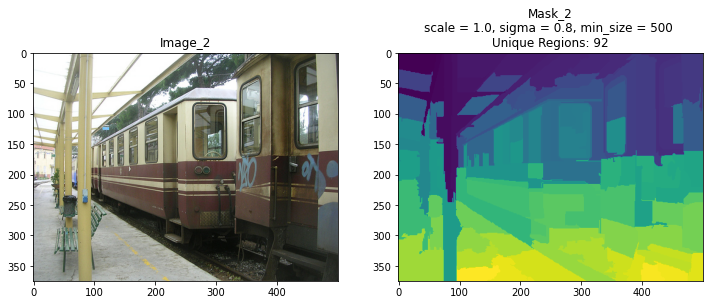

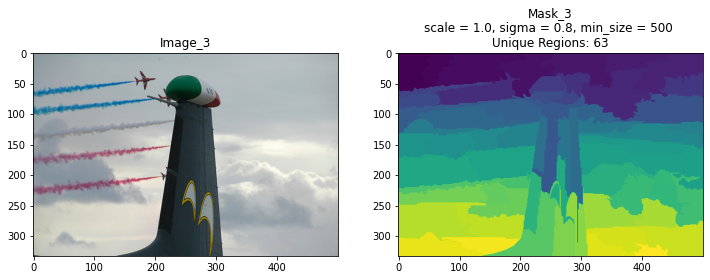

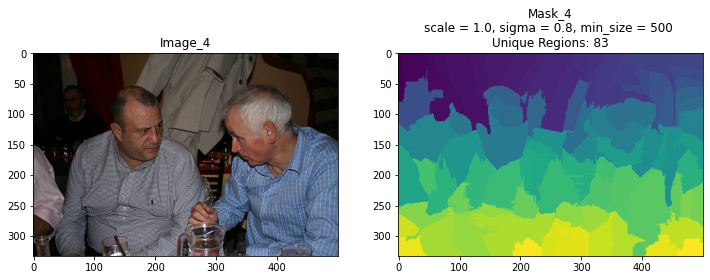

In [ ]:
random_images = np.random.choice(image_files, 4)
plot_segmentation_samples(random_images, 1.0, 0.8, 500)

Note that the RCNN system requires us to extract around 2000 unique regions and in our samples none of them were even close to 2000. This is okay for the sake of visualization and understanding the concepts, but while generating region proposals for all the images in our dataset, we would tweak the parameters for the Felzenswalb-Huttenlocher Segmentation to meet the approximate required number of region proposals per image.

In [ ]:
def get_color_histogram(image, bins=25):
    histogram = np.array([])
    for channel in (0, 1, 2):
        # extracting one colour channel
        c = image[:, channel]
        # calculate histogram for each colour and join to the result
        histogram = np.concatenate(
            [histogram] + [np.histogram(
                c, bins, (0.0, 255.0)
            )[0]]
        )
    # L1 normalize
    histogram = histogram / len(image)
    return histogram

In [ ]:
def plot_color_histogram(images_list):
    for index, image_path in enumerate(images_list):
        original_image = np.array(Image.open(image_path))
        color_histogram = get_color_histogram(original_image)
        fig = plt.figure(figsize=(12, 12))
        ax = fig.add_subplot(1, 2, 1)
        ax.imshow(original_image)
        ax.set_title('Image_{}'.format(index + 1))
        ax = fig.add_subplot(1, 2, 2)
        ax.hist(color_histogram, bins=25)
        ax.set_title('Color_Histogram_{}'.format(index + 1))
        plt.show()

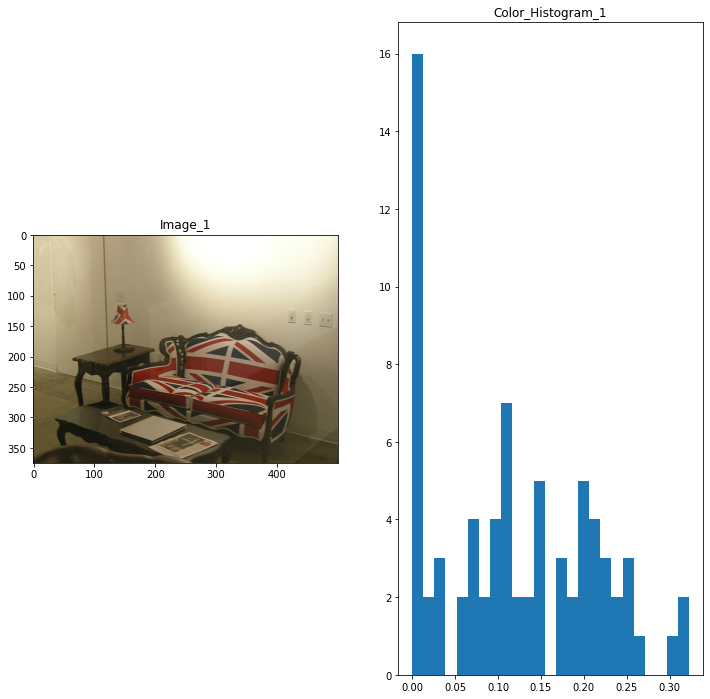

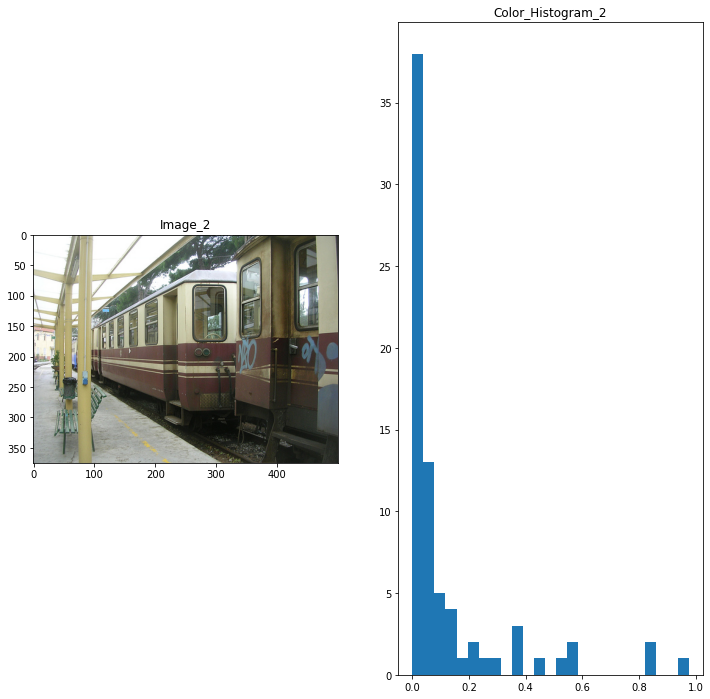

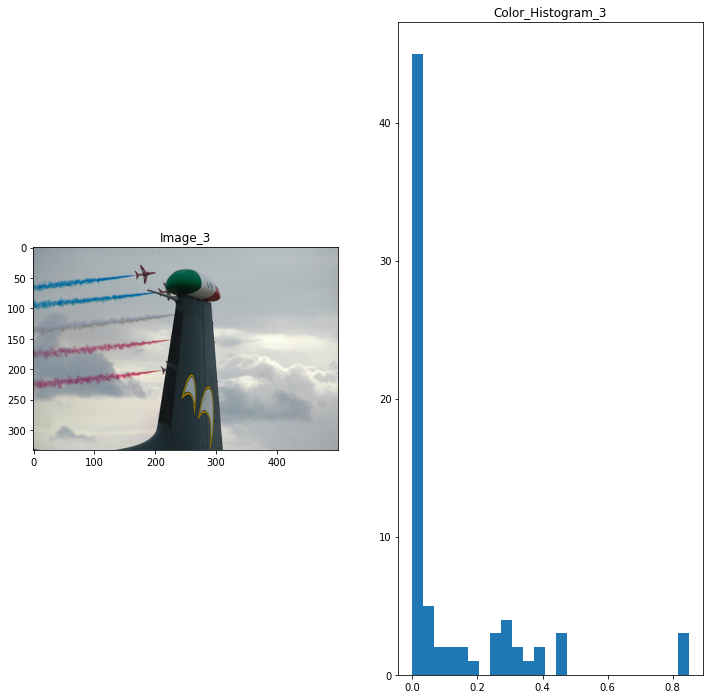

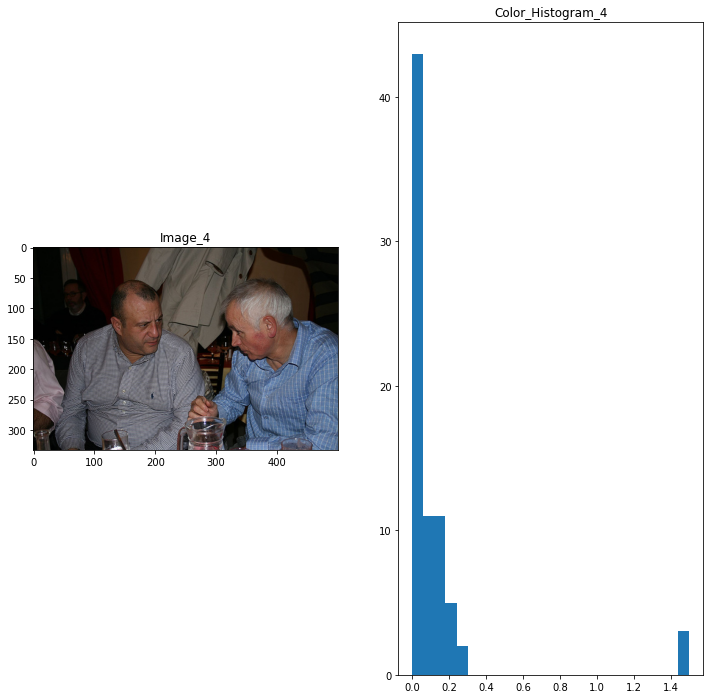

In [ ]:
plot_color_histogram(random_images)

### Selective Search Alogorithm

The [Selective Search](http://www.huppelen.nl/publications/selectiveSearchDraft.pdf) Algorithm addresses the problem of generating possible object locations for use in object recognition. It combines the strength of both an exhaustive search and segmentation. Instead of a single technique to generate possible object locations, it diversifies our search and use a variety of complementary image partitionings to deal with as many image conditions as possible. The reduced number of locations compared to an exhaustive search enables the use of stronger machine learning techniques and stronger appearance models for object recognition.

A selective search algorithm is subject to the following design considerations:

1. **Capture All Scales:** Objects can occur at any scale within the image. Furthermore, some objects have less clear boundaries then other objects. Therefore, in selective search all object scales have to be taken into account. The original SelectiveSearch algorithm proposed Gaussian derivative for 8 orientations, but we use LBPH (Local Bainary Pattern Histogram) instead.

2. **Diversification:** There is no single optimal strategy to group regions together, regions may form an object because of only colour, only texture, or because parts are enclosed. Furthermore, lighting conditions such as shading and the colour of the light may influence how regions form an object. Therefore instead of a single strategy which works well in most cases, we want to have a diverse set of strategies to deal with all cases.

3. **Fast to Compute:** The goal of selective search is to yield a set of
possible object locations for use in a practical object recognition framework. The creation of this set should not become a computational bottleneck.

In the Selective Search paper, 3 main proposed diversification strategies are:

1. varying the colour space
2. varying the similarity measures
3. varying the thresholds to obtain the starting regions


#### Local Binary Pattern

In order to capture the texture similarities of the initial regions, for each initial region, we would calculate Local Binary Pattern features. Local Binary Pattern (LBP) is a simple yet very efficient texture operator which labels the pixels of an image by thresholding the neighborhood of each pixel and considers the result as a binary number. In simple terms, we can perform LBP of a texture using the following steps:

1. Convert the image to grayscale in order to reduce dimensionality and keep things simple. Let's say, the 

2. For each pixel in the image, we select a neighborhood of size `r` (let's say `r = 3`) surrounding the pixel. Let us consider the following example of neighbourhood from a grayscale image: 

<center>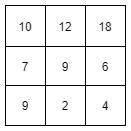</center>

3. For each pixel's selected neighbour, we would compapre the center value and its neighboor values. If the neighboor values are greater than center, record 1 else record 0.

Mathematically, LPB can be described as $$LBP = \sum_{n=0}^{7}s(i_{n} - i_{c}) * 2^{n}$$ where <code>i<sub>c</sub></code> represents the center pixel value and <code>i<sub>n</sub></code> represents the neighbouring pixel value and $$s(z) = \begin{Bmatrix} 1, & z \geq 0\\ 0, & z < 0 \end{Bmatrix}$$.

By this formula, the binary matrix can be written as:

<center>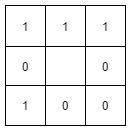</center>

4. Convert the combination of binary values to a digit. The combination may be clockwise or anticlockwise, but it wouldn't affect the final result.

In Clockwise manner, the binart value can be combined to be <code>(11100010)<sub>2</sub> = (226)<sub>10</sub></code>. Hence, the matrix would be

<center>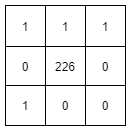</center>

In [ ]:
from skimage.feature import local_binary_pattern


def get_texture_gradient(image):
    gradient = np.zeros((image.shape[0], image.shape[1], image.shape[2]))
    gradient[:, :, 0] = local_binary_pattern(image[:, :, 0], 8, 1.0)
    gradient[:, :, 1] = local_binary_pattern(image[:, :, 1], 8, 1.0)
    gradient[:, :, 2] = local_binary_pattern(image[:, :, 2], 8, 1.0)
    return gradient

In [ ]:
def plot_texture_gradients(images_list):
    for index, image_path in enumerate(images_list):
        original_image = np.array(Image.open(image_path))
        texture_gradient = get_texture_gradient(original_image)
        fig = plt.figure(figsize=(12, 24))
        ax = fig.add_subplot(1, 2, 1)
        ax.imshow(original_image)
        ax.set_title('Image_{}'.format(index + 1))
        ax = fig.add_subplot(1, 2, 2)
        ax.imshow(texture_gradient.astype(np.uint8))
        ax.set_title('Texture_Gradient_{}'.format(index + 1))
        plt.show()

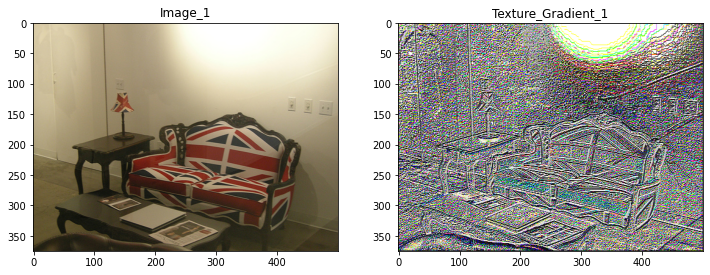

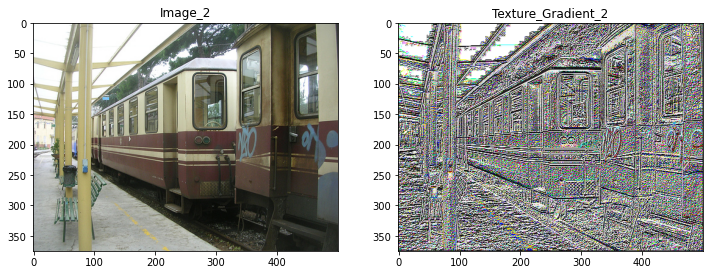

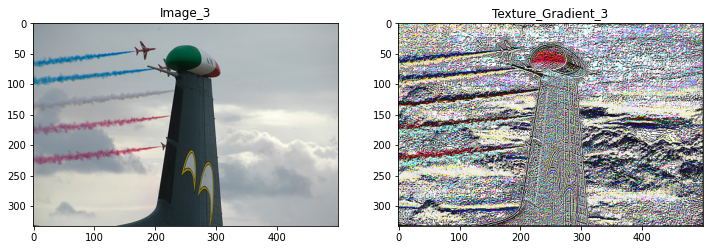

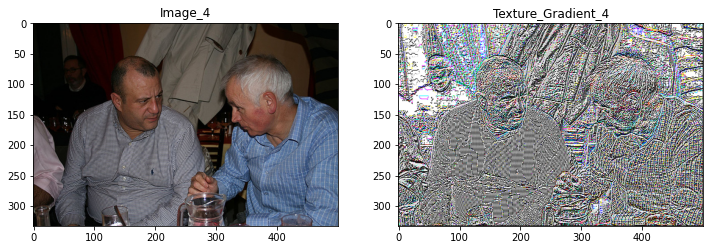

In [ ]:
plot_texture_gradients(random_images)

In [ ]:
def get_texture_histogram(image, bins=10):
    histogram = np.array([])
    for channel in (0, 1, 2):
        # mask by the colour channel
        c = image[:, channel]
        # calculate histogram for each orientation and concatenate them all
        # and join to the result
        histogram = np.concatenate(
            [histogram] + [np.histogram(c, bins, (0.0, 1.0))[0]])
    # L1 Normalize
    histogram = histogram / len(image)
    return histogram

In [ ]:
def plot_color_histogram(images_list):
    for index, image_path in enumerate(images_list):
        original_image = np.array(Image.open(image_path))
        texture_histogram = get_color_histogram(original_image)
        fig = plt.figure(figsize=(12, 12))
        ax = fig.add_subplot(1, 2, 1)
        ax.imshow(original_image)
        ax.set_title('Image_{}'.format(index + 1))
        ax = fig.add_subplot(1, 2, 2)
        ax.hist(texture_histogram, bins=10)
        ax.set_title('Texture_Histogram_{}'.format(index + 1))
        plt.show()

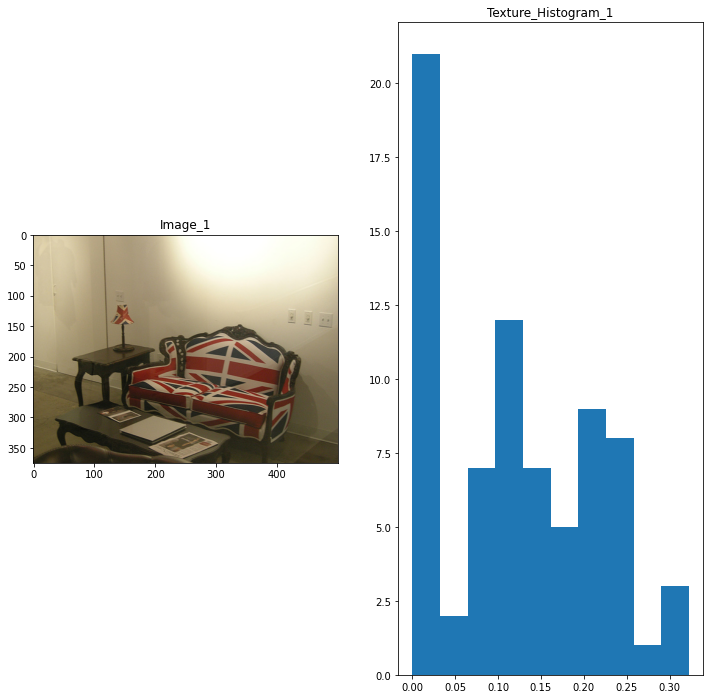

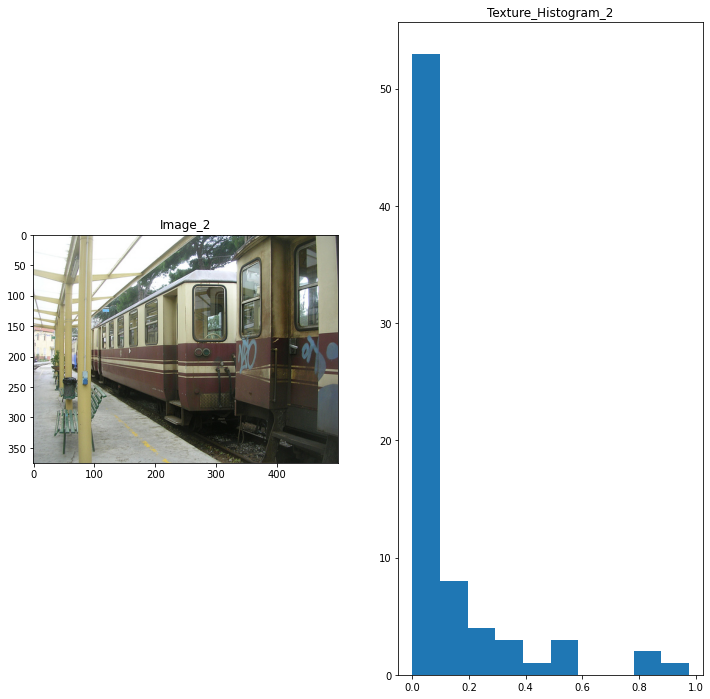

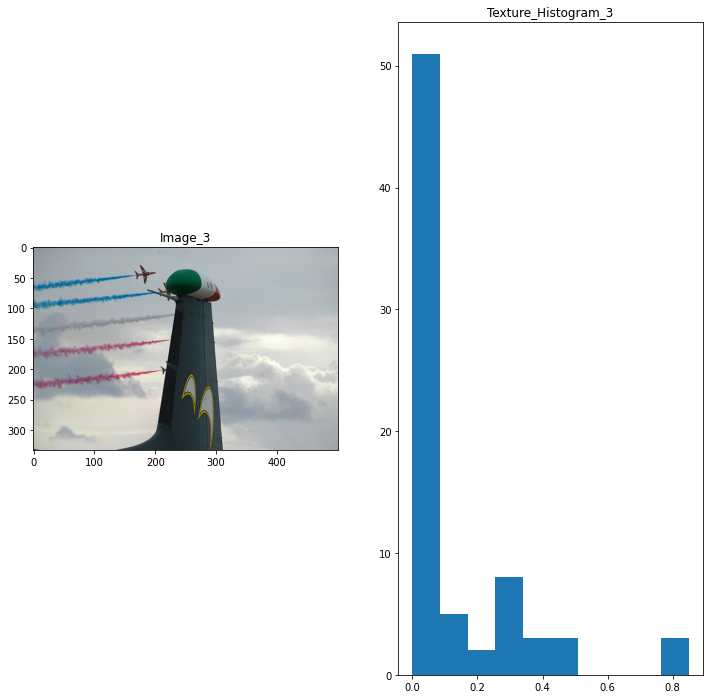

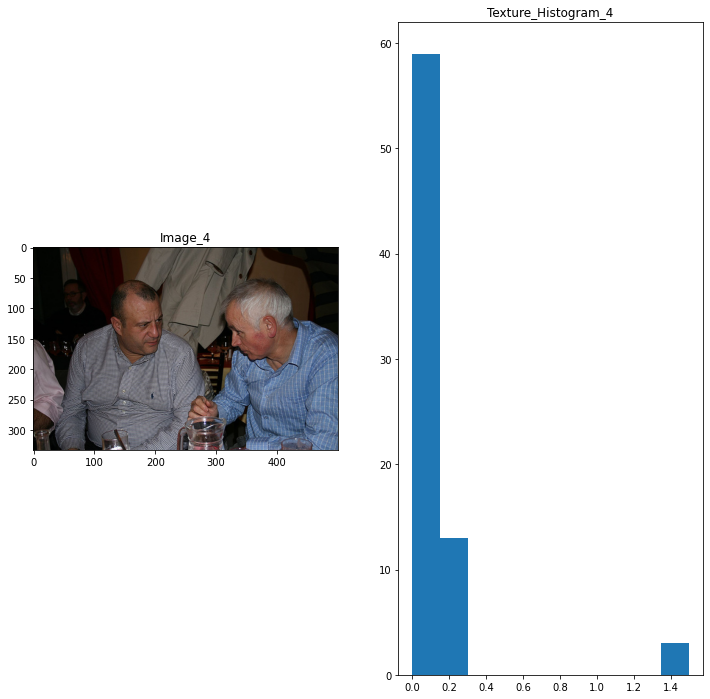

In [ ]:
plot_color_histogram(random_images)

Now, it's time to extract the unique regions as per our segmentation algorithm. We would define a function `get_regions` that takes in an RGB image and gives out a list of dictionaries, such that each dictionary represents a bounding box's coordinates.

In [ ]:
def extract_regions(image):
    regions = {}
    hsv = rgb2hsv(image[:, :, :3])
    # count pixel positions
    for y, i in enumerate(image):
        for x, (r, g, b, l) in enumerate(i):
            # initialize a new region
            if l not in regions:
                regions[l] = {
                    "min_x": 0xffff,
                    "min_y": 0xffff,
                    "max_x": 0,
                    "max_y": 0,
                    "labels": [l]
                }
            # bounding box
            if regions[l]["min_x"] > x:
                regions[l]["min_x"] = x
            if regions[l]["min_y"] > y:
                regions[l]["min_y"] = y
            if regions[l]["max_x"] < x:
                regions[l]["max_x"] = x
            if regions[l]["max_y"] < y:
                regions[l]["max_y"] = y
    # calculate texture gradient
    texture_gradient = get_texture_gradient(image)
    # calculate colour histogram of each region
    for k, v in list(regions.items()):
        # colour histogram
        masked_pixels = hsv[:, :, :][image[:, :, 3] == k]
        regions[k]["size"] = len(masked_pixels / 4)
        regions[k]["hist_c"] = get_color_histogram(masked_pixels)
        # texture histogram
        regions[k]["hist_t"] = get_texture_histogram(
            texture_gradient[:, :][image[:, :, 3] == k]
        )
    return regions

In [ ]:
import seaborn as sns


# https://xkcd.com/color/rgb/
common_colors = sns.xkcd_rgb.values()


def plot_all_regions(image_path, scale, sigma, min_size, figsize=(15, 15)):
    plt.figure(figsize=figsize)
    image = Image.open(image_path)
    segmentation_result = graph_based_segmentation(image, 1.0, 0.8, 500)
    regions = extract_regions(segmentation_result)
    plt.imshow(image)
    plt.xlabel('Regions: {}'.format(len(regions.values())))
    for item, color in zip(regions.values(), common_colors):
        x1 = item["min_x"]; y1 = item["min_y"]
        x2 = item["max_x"]; y2 = item["max_y"]
        label = item["labels"][0]
        plot_bbox(label, x1, y1, x2, y2, backgroundcolor=color)
    plt.show()

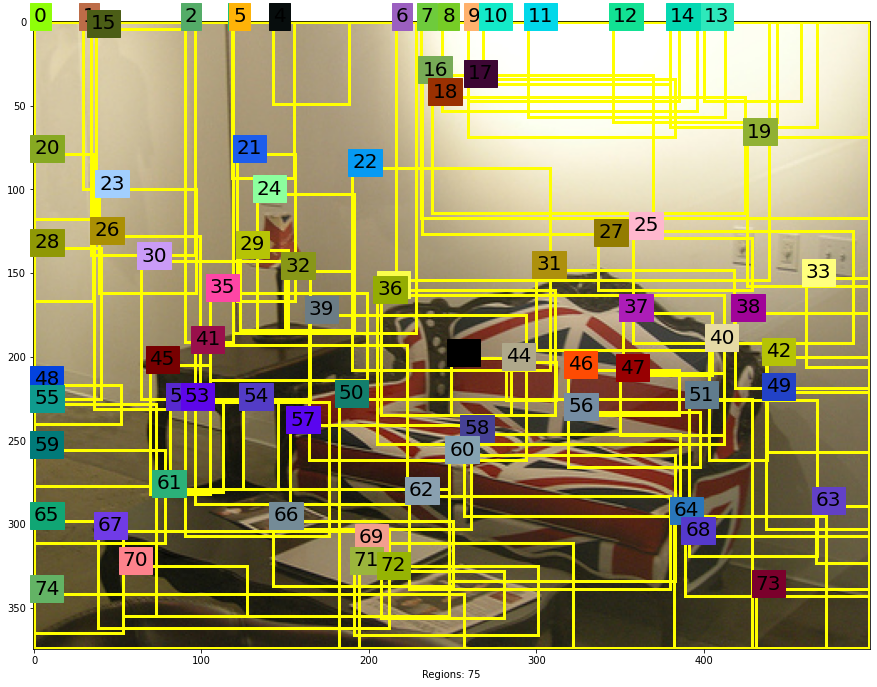

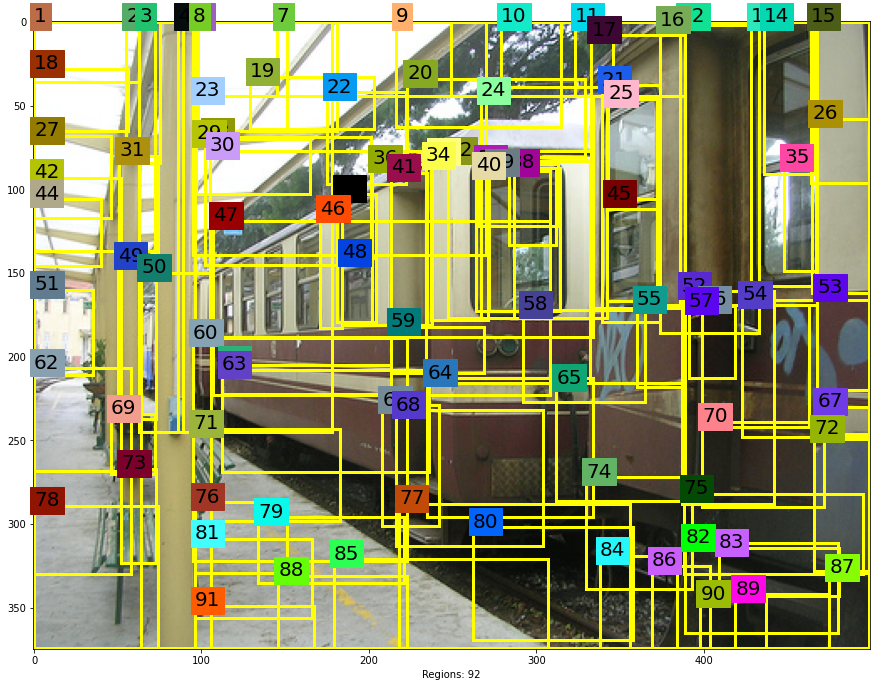

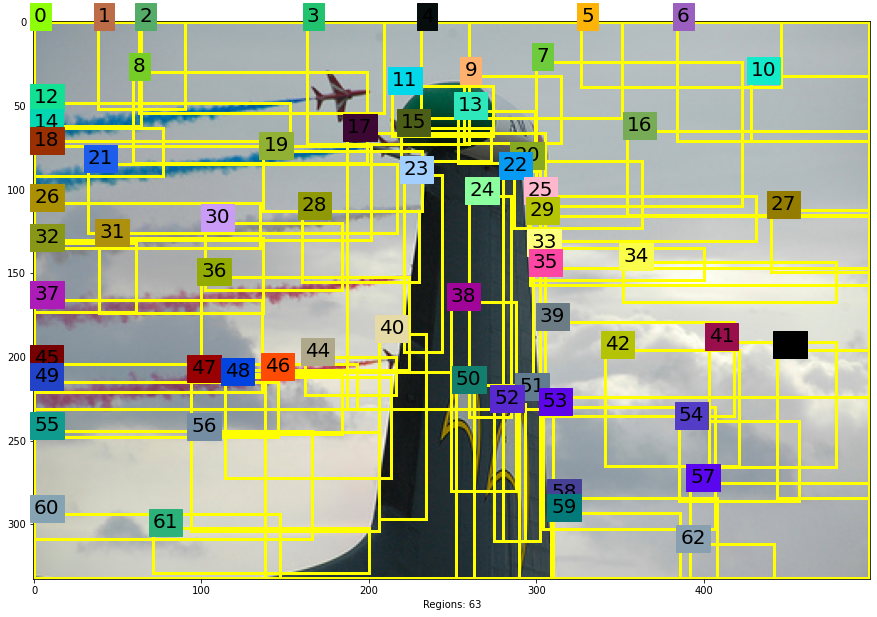

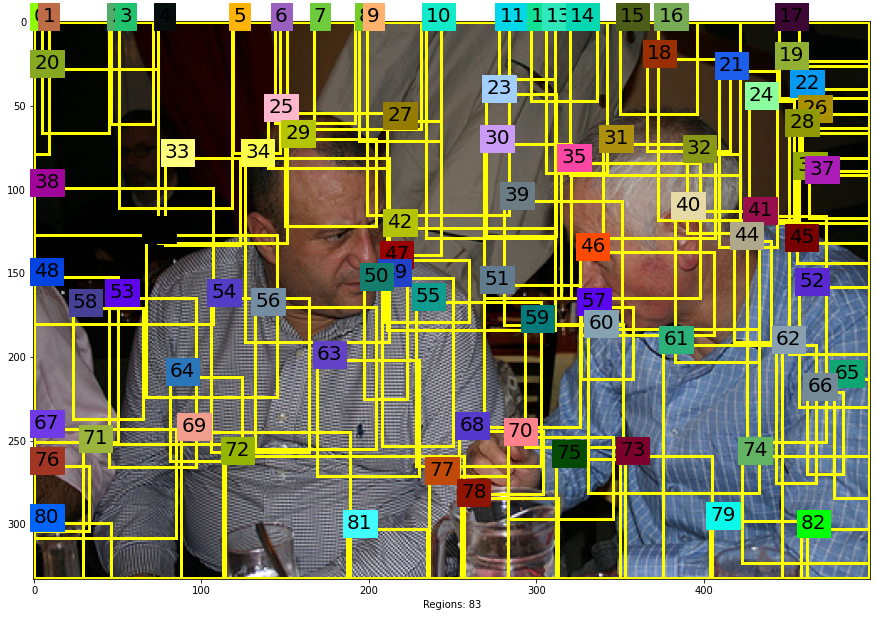

In [ ]:
for image_path in random_images:
    plot_all_regions(image_path, 1.0, 0.8, 500)

In [ ]:
def intersect(a, b):
    if (a["min_x"] < b["min_x"] < a["max_x"]
            and a["min_y"] < b["min_y"] < a["max_y"]) or (
        a["min_x"] < b["max_x"] < a["max_x"]
            and a["min_y"] < b["max_y"] < a["max_y"]) or (
        a["min_x"] < b["min_x"] < a["max_x"]
            and a["min_y"] < b["max_y"] < a["max_y"]) or (
        a["min_x"] < b["max_x"] < a["max_x"]
            and a["min_y"] < b["min_y"] < a["max_y"]):
        return True
    return False

In [ ]:
def extract_neighbours(regions):
    R = list(regions.items())
    neighbours = []
    for cur, a in enumerate(R[:-1]):
        for b in R[cur + 1:]:
            if intersect(a[1], b[1]):
                neighbours.append((a, b))
    return neighbours

In [ ]:
def merge_regions(r1, r2):
    new_size = r1["size"] + r2["size"]
    rt = {
        "min_x": min(r1["min_x"], r2["min_x"]),
        "min_y": min(r1["min_y"], r2["min_y"]),
        "max_x": max(r1["max_x"], r2["max_x"]),
        "max_y": max(r1["max_y"], r2["max_y"]),
        "size": new_size,
        "hist_c": (
            r1["hist_c"] * r1["size"] + r2["hist_c"] * r2["size"]) / new_size,
        "hist_t": (
            r1["hist_t"] * r1["size"] + r2["hist_t"] * r2["size"]) / new_size,
        "labels": r1["labels"] + r2["labels"]
    }
    return rt

In [ ]:
def get_color_similarity(r1, r2):
    return sum([min(a, b) for a, b in zip(r1["hist_c"], r2["hist_c"])])


def get_texture_similarity(r1, r2):
    return sum([min(a, b) for a, b in zip(r1["hist_t"], r2["hist_t"])])


def get_size_similarity(r1, r2, imsize):
    return 1.0 - (r1["size"] + r2["size"]) / imsize


def get_fill_similarity(r1, r2, imsize):
    bbsize = (
        (max(r1["max_x"], r2["max_x"]) - min(r1["min_x"], r2["min_x"]))
        * (max(r1["max_y"], r2["max_y"]) - min(r1["min_y"], r2["min_y"]))
    )
    return 1.0 - (bbsize - r1["size"] - r2["size"]) / imsize


def get_similarity(r1, r2, imsize):
    color_sim = get_color_similarity(r1, r2)
    texture_sim = get_texture_similarity(r1, r2)
    size_sim = get_size_similarity(r1, r2, imsize)
    fill_sim = get_fill_similarity(r1, r2, imsize)
    return color_sim, texture_sim, size_sim, fill_sim

In [ ]:
def selective_search(original_image, scale, sigma, min_size):
    # [r,g,b,(region)]
    img = graph_based_segmentation(original_image, scale, sigma, min_size)
    if img is None:
        return None, {}
    imsize = img.shape[0] * img.shape[1]
    R = extract_regions(img)
    # extract neighbouring information
    neighbours = extract_neighbours(R)
    # calculate initial similarities
    S = {}
    for (ai, ar), (bi, br) in neighbours:
        S[(ai, bi)] = get_similarity(ar, br, imsize)
    # hierarchal search
    while S != {}:
        # get highest similarity
        i, j = sorted(S.items(), key=lambda i: i[1])[-1][0]
        # merge corresponding regions
        t = max(R.keys()) + 1.0
        R[t] = merge_regions(R[i], R[j])
        # mark similarities for regions to be removed
        key_to_delete = []
        for k, v in list(S.items()):
            if (i in k) or (j in k):
                key_to_delete.append(k)
        # remove old similarities of related regions
        for k in key_to_delete:
            del S[k]
        # calculate similarity set with the new region
        for k in [a for a in key_to_delete if a != (i, j)]:
            n = k[1] if k[0] in (i, j) else k[0]
            S[(t, n)] = get_similarity(R[t], R[n], imsize)
    regions = []
    for k, r in list(R.items()):
        regions.append({
            'rect': (
                r['min_x'], r['min_y'],
                # r['max_x'] - r['min_x'], r['max_y'] - r['min_y']),
                r['max_x'] , r['max_y'] ),
            'size': r['size'],
            'labels': r['labels']
        })
    return img, regions

In [ ]:
def plot_selected_regions(image_path, scale, sigma, min_size, figsize=(15, 15)):
    plt.figure(figsize=figsize)
    image = Image.open(image_path)
    regions = selective_search(image, scale, sigma, min_size)[1]
    plt.imshow(image)
    plt.xlabel('Regions: {}'.format(len(regions)))
    for item, color in zip(regions, common_colors):
        x1 = item['rect'][0]; y1 = item['rect'][1]
        # x2 = item['rect'][0] + item['rect'][2]
        # y2 = item['rect'][1] + item['rect'][3]
        x2 = item['rect'][2]
        y2 = item['rect'][3]
        label = item["labels"][0]
        plot_bbox(label, x1, y1, x2, y2, backgroundcolor=color)
    plt.show()

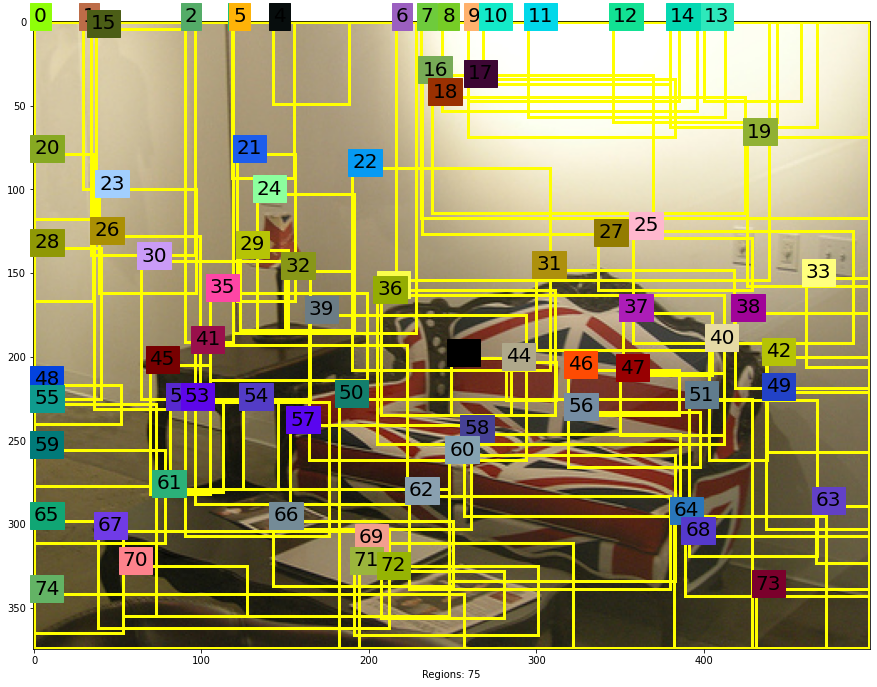

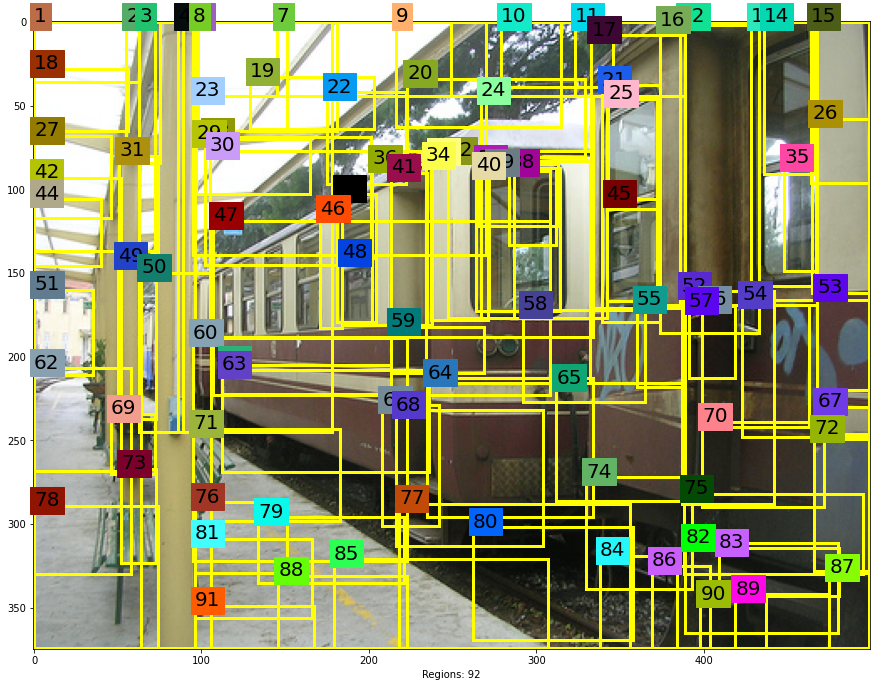

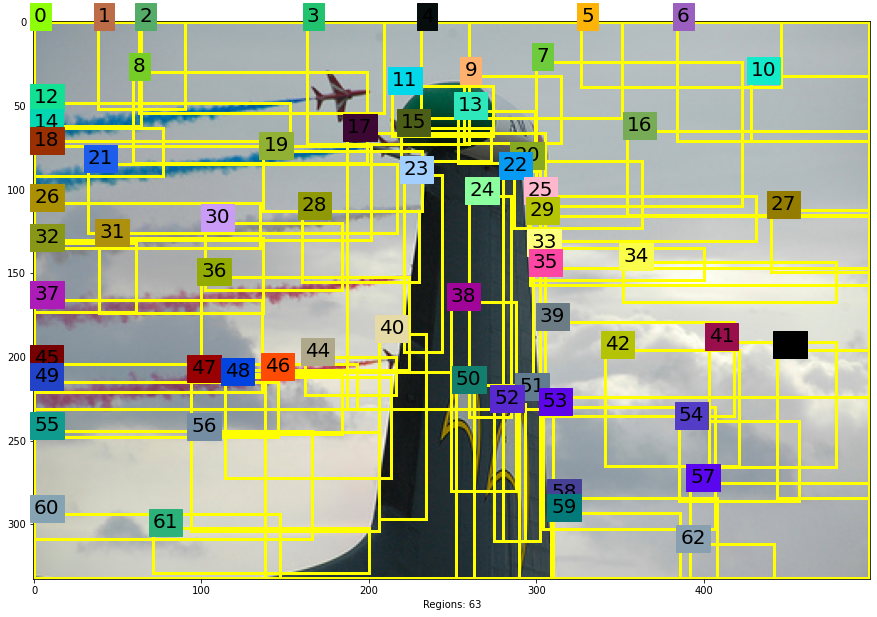

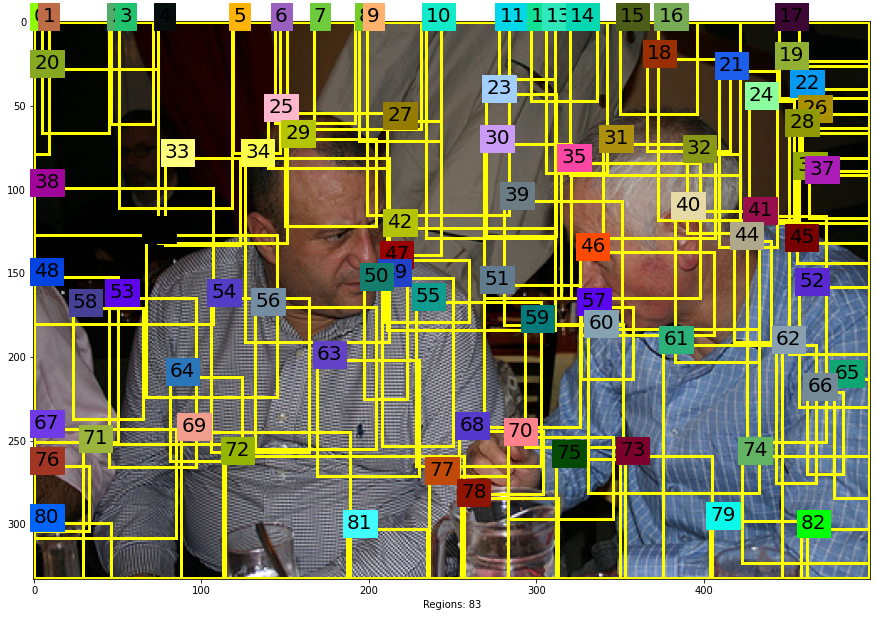

In [ ]:
for image_path in random_images:
    plot_all_regions(image_path, 1.0, 0.8, 500)

Now that we have figured out the bounding box generation method, we should now benchmark it against the labelled ground truths in the VOC2012 dataset.

**Intersect over Union** or **IoU** is a metric that allows us to evaluate how similar our predicted bounding box is to the ground truth bounding box. The idea is that we want to compare the ratio of the area where the two boxes overlap to the total combined area of the two boxes.

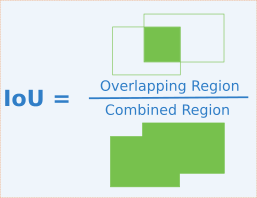

In [ ]:
def get_bbox_dimensions(xmin1, xmax1, ymin1, ymax1):
    width1 = xmax1 - xmin1
    height1 = ymax1 - ymin1
    area1 = width1 * height1
    return (width1, height1, area1)

In [ ]:
def get_iou(xmin1, ymin1, xmax1, ymax1, xmin2, ymin2, xmax2, ymax2):
    width1, height1, area1 = get_bbox_dimensions(
        xmin1, xmax1, ymin1, ymax1
    )
    width2, height2, area2 = get_bbox_dimensions(
        xmin2, xmax2, ymin2, ymax2
    )        
    int_xmin = np.max([xmin1, xmin2])
    int_ymin = np.max([ymin1, ymin2])
    int_xmax = np.min([xmax1, xmax2])
    int_ymax = np.min([ymax1, ymax2])            
    int_width = int_xmax - int_xmin
    int_height = int_ymax - int_ymin
    int_area = int_width * int_height
    return 0 if (int_width < 0) or (int_height < 0)\
     else int_area / float(area1 + area2 - int_area)

Since `person` is the most frequest class of objects appearing on the VOC2012 dataset, we would only keep the images that contain at least one person object.

In [ ]:
from math import isnan


def get_bbox_list(annotation_dataframe, class_filter):
    bbox = []
    for index in tqdm(range(len(annotation_dataframe))):
        row = annotation_dataframe.loc[index, :]
        for i in range(1, 57):
            if row['class_{}'.format(i)] == class_filter:
                if not (
                    isnan(row['xmax_{}'.format(i)]) and\
                     isnan(row['xmin_{}'.format(i)]) and\
                      isnan(row['ymax_{}'.format(i)]) and\
                      isnan(row['ymin_{}'.format(i)])
                ):
                    bbox.append([
                        row['image_id'],
                        row['xmax_{}'.format(i)],
                        row['xmin_{}'.format(i)],
                        row['ymax_{}'.format(i)],
                        row['ymin_{}'.format(i)]
                    ])
    return bbox

In [ ]:
bbox_list = get_bbox_list(dataframe, 'person')
print('Number of person objects:', len(bbox_list))


Number of person objects: 17401


In [ ]:
def plot_iou(image_path, actual_box, scale, sigma, min_size, figsize=(12, 12)):
    sample_image = Image.open(image_path)
    _, regions = selective_search(
        sample_image, scale=scale,
        sigma=sigma, min_size=min_size
    )
    proposed_bboxes = [region['rect'] for region in regions]
    plt.figure(figsize=figsize)
    for box in proposed_bboxes:
        iou = get_iou(
            actual_box[1], actual_box[3],
            actual_box[0], actual_box[2],
            box[0], box[1], box[2], box[3]
        )
        plt.imshow(sample_image)
        if iou > 0.5:
            plot_bbox(
                'iou={}'.format(iou), box[0], box[1],
                box[2], box[3], backgroundcolor='yellow'
            )
            plot_bbox(
                '', actual_box[1], actual_box[3],
                actual_box[0], actual_box[2], line_color='pink'
            )

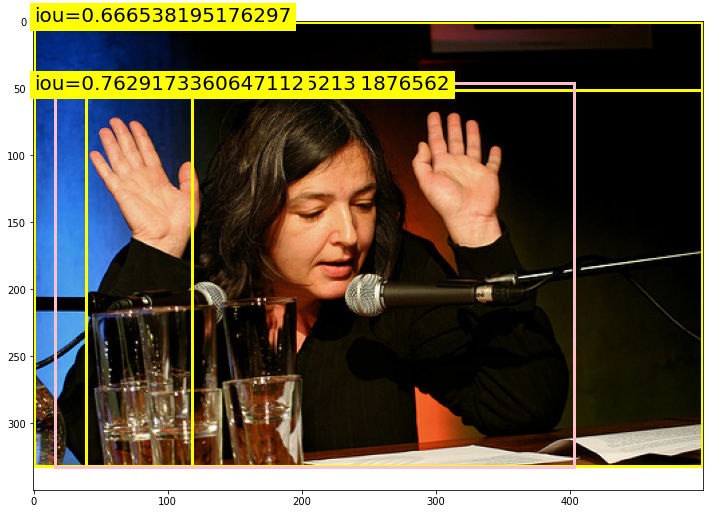

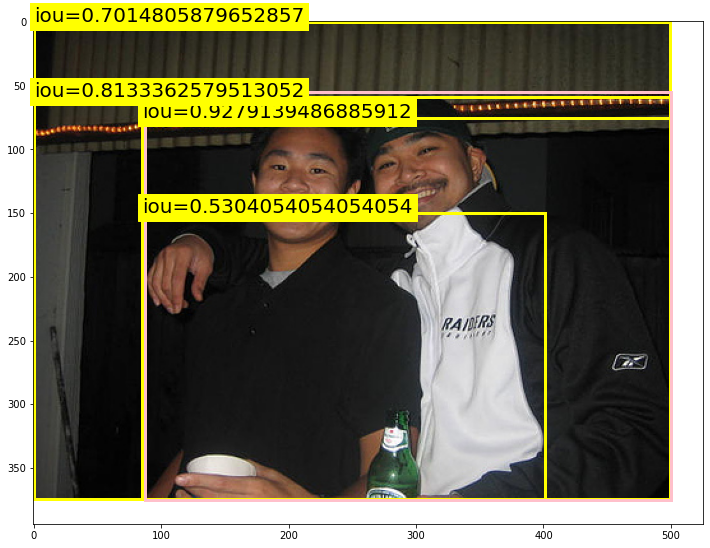

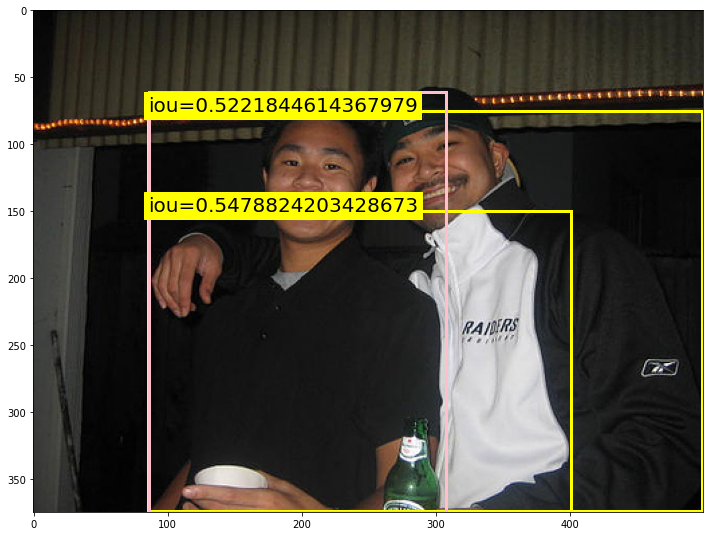

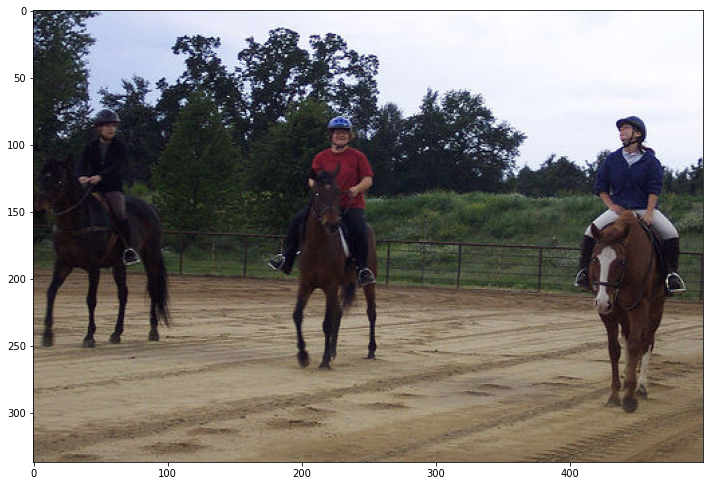

In [ ]:
for box in bbox_list[:4]:
    plot_iou(
        './VOCdevkit/VOC2012/JPEGImages/' + box[0] + '.jpg',
        box[1:], 500, 0.9, 10
    )

Well.... that was pathetic performance. Probably the problem is that we have not tuned in the parameters of Selective Search properly. Let's try to pit our implementation of selective search against that of OpenCV's and see if our implementation was truly pathetic or were we just dealing with edge cases.

In [ ]:
import cv2


cv2.setUseOptimized(True)
cv2.setNumThreads(8)


def opencv_selective_search(image):
    segmentation = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    segmentation.setBaseImage(image)
    segmentation.switchToSelectiveSearchFast()
    return segmentation.process()

In [ ]:
def opencv_plot_iou(image_path, actual_box, figsize=(12, 12)):
    sample_image = Image.open(image_path)
    proposed_bboxes = opencv_selective_search(cv2.imread(image_path))
    plt.figure(figsize=figsize)
    for box in proposed_bboxes:
        iou = get_iou(
            actual_box[1], actual_box[3],
            actual_box[0], actual_box[2],
            box[0], box[1], box[2] + box[0],
            box[3] + box[1]
        )
        plt.imshow(sample_image)
        if iou > 0.5:
            plot_bbox(
                'iou={}'.format(iou), box[0], box[1],
                box[2], box[3], backgroundcolor='yellow'
            )
            plot_bbox(
                '', actual_box[1], actual_box[3],
                actual_box[0], actual_box[2], line_color='pink'
            )

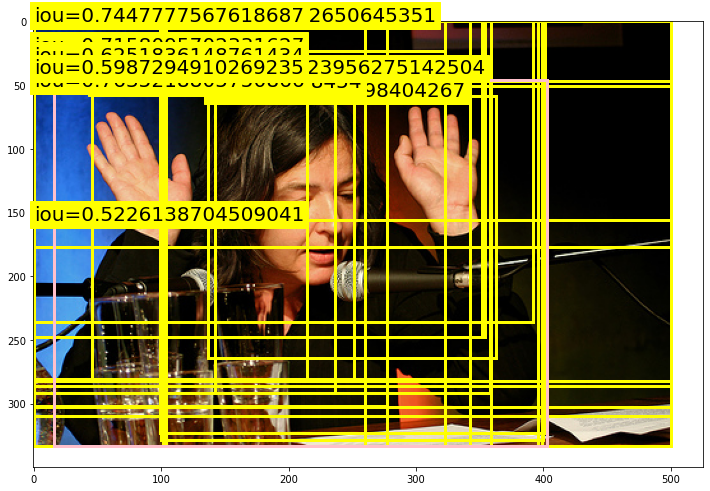

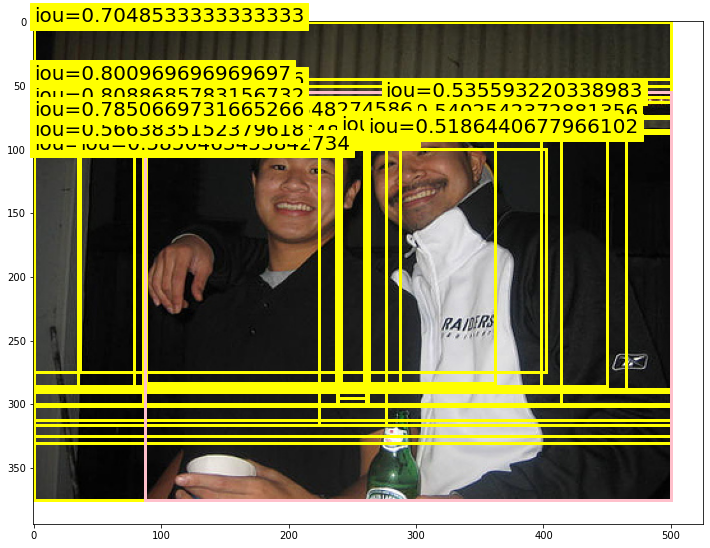

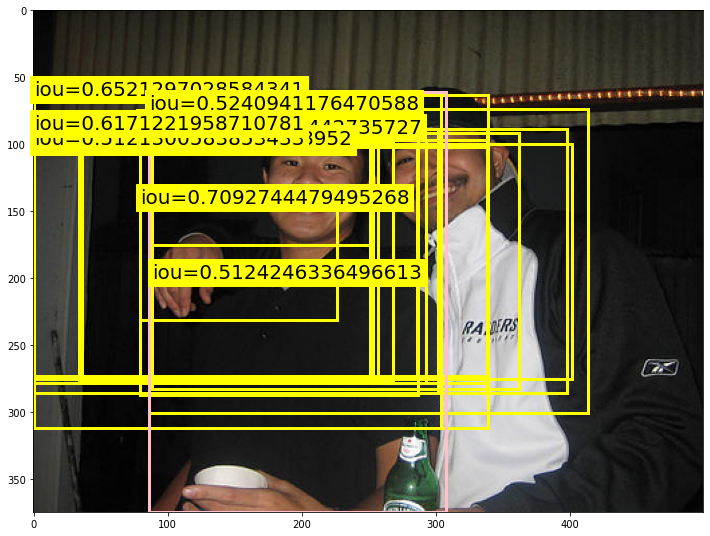

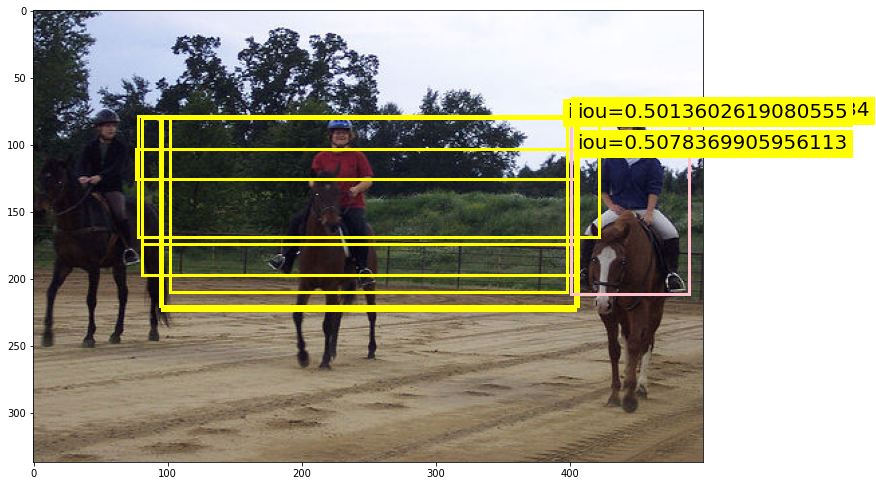

In [ ]:
for box in bbox_list[:4]:
    opencv_plot_iou(
        './VOCdevkit/VOC2012/JPEGImages/' + box[0] + '.jpg', box[1:]
    )

The OpenCV implementation is certainly much much better and one of the perks of using it is the we don't need to specify the parameters (probably for each image). Note that the OpenCV implementation takes a lot more time to run compared to our implementation and that's probably because it's searching for the best set of parameters to maximize the number of regions proposed. For now, we would go with the OpenCV implementation in spite of it being slower (RCNN is slow, that's one of the reasons Fast RCNN and Faster RCNN exists) because we want the detector to actually detect some objects in the image (even if the algorithm is overconfident in this aspect) and I don't have the patience to figure out the optimal set of parameters for every image. If there are too many region proposals generate for a single object, we can always use Non-Maximal Suppression.

## Training the CNN

Now comes the exciting part, training our model. By generating the bounding box proposals, we have already reduced the problem to a mere classification problem. All we need to do now is to build our model.

When the RCNN paper had come out, the authors had fine-tuned an AlexNet model pre-trained on the ImageNet dataset. But now in 2020, we have come a long way in terms of good pre-trained classification models pre-trained on ImageNet. Still, let's not start calling the biggest guns right away, and know our place. We would be using a pre-trained ResNet50 model and fine-tuning it to recognize persons (check the frequency, its basically persons against the rest of the classes) from the VOC dataset.